# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:
A400M = 'DATASET/TRAIN/A400M'
AG600 = 'DATASET/TRAIN/AG600'
Be200 = 'DATASET/TRAIN/Be200'

In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR A400M:

======== Images in:  DATASET/TRAIN/A400M
Images_count :	 70
Min_width :	 69
Max_width :	 5268
Min_height :	 55
Max_height :	 2960



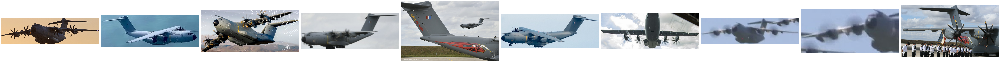

In [5]:
print("")
print("TRAINING DATA FOR A400M:")
print("")
images_details(A400M)
print("")
plot_images(A400M, 10) 


TRAINING DATA FOR AG600:

======== Images in:  DATASET/TRAIN/AG600
Images_count :	 70
Min_width :	 156
Max_width :	 2083
Min_height :	 55
Max_height :	 1228



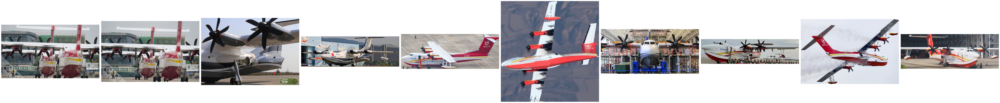

In [6]:
print("")
print("TRAINING DATA FOR AG600:")
print("")
images_details(AG600)
print("")
plot_images(AG600, 10)


TRAINING DATA FOR Be200:

======== Images in:  DATASET/TRAIN/Be200
Images_count :	 74
Min_width :	 56
Max_width :	 4664
Min_height :	 17
Max_height :	 1848



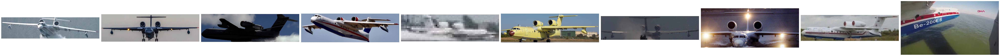

In [7]:
print("")
print("TRAINING DATA FOR Be200:")
print("")
images_details(Be200)
print("")
plot_images(Be200, 10)

In [8]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 5735 images belonging to 30 classes.


In [9]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 2081 images belonging to 30 classes.


In [10]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(30, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [11]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [12]:
epochs = 10
batch_size = 512

In [13]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/10


11/11 [==============================] - ETA: 0s - loss: 56.6357 - accuracy: 0.0398
Epoch 1: accuracy improved from -inf to 0.03977, saving model to MANUAL.h5
11/11 [==============================] - 9s 771ms/step - loss: 56.6357 - accuracy: 0.0398 - val_loss: 3.4095 - val_accuracy: 0.0312
Epoch 2/10
11/11 [==============================] - ETA: 0s - loss: 3.4048 - accuracy: 0.0682
Epoch 2: accuracy improved from 0.03977 to 0.06818, saving model to MANUAL.h5
11/11 [==============================] - 16s 1s/step - loss: 3.4048 - accuracy: 0.0682 - val_loss: 3.4025 - val_accuracy: 0.0234
Epoch 3/10
11/11 [==============================] - ETA: 0s - loss: 3.3936 - accuracy: 0.1506
Epoch 3: accuracy improved from 0.06818 to 0.15057, saving model to MANUAL.h5
11/11 [==============================] - 11s 1s/step - loss: 3.3936 - accuracy: 0.1506 - val_loss: 3.4218 - val_accuracy: 0.0234
Epoch 4/10
11/11 [==============================] - ETA: 0s - loss: 3.3889 - accuracy: 0.1193


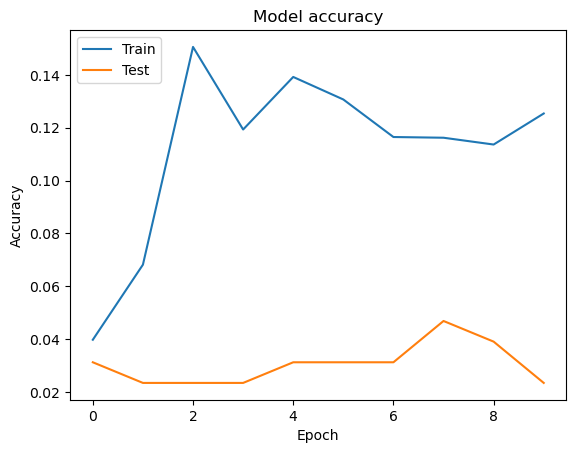

In [14]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

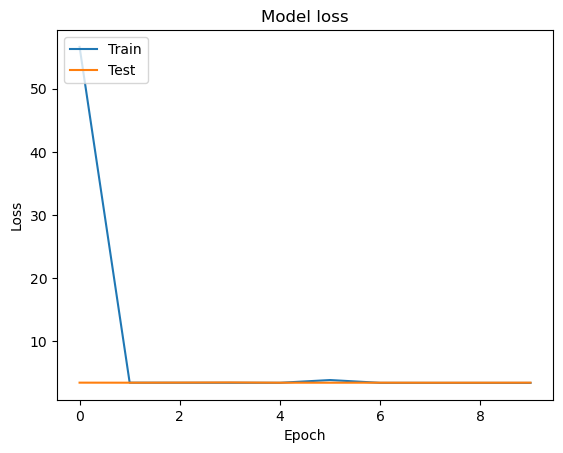

In [15]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()